In [11]:
import pandas as pd
import numpy as np
import networkx as nx 
import pickle
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from svgpathtools import svg2paths
from svgpath2mpl import parse_path
import matplotlib as mpl
from operator import itemgetter
import seaborn as sns
sns.set()
from fa2 import ForceAtlas2

In [12]:
Handle_data = pd.read_csv('../Data/Processed/Twitter_Handles.csv', index_col=0).set_index('Twitter')
Follow_df = pd.read_csv('../Data/Processed/Follow_df.csv', index_col=0)

with open('../Data/Processed/No_follow_dict.pickle', 'rb') as handle:
    No_follow_dict = pickle.load(handle)

In [13]:
G = nx.from_numpy_matrix(Follow_df.values, create_using=nx.DiGraph())

# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(Follow_df.columns)}
G = nx.relabel_nodes(G, label_mapping)

In [14]:
dict_abb_party = {'R': 'Republican', 'D': 'Democrat', 'I': 'Independent', 'L': 'Libertarians'}

## Attributes and isolates

In [15]:
# Add atributes
for node in G.nodes:
    # Other info from data set
    G.nodes[node].update(Handle_data.loc[node].to_dict())

    # Number of total following 
    G.nodes[node].update({"Total_follow": No_follow_dict[node]})

In [16]:
nodes_to_remove = list(nx.isolates(G))
G.remove_nodes_from(nodes_to_remove)
print(f"{len(nodes_to_remove)} nodes removed as they are isolates")

7 nodes removed as they are isolates


## Basic stats

In [17]:
# Nodes
len(G.nodes)

610

In [18]:
# Distribution of parties
Handle_data.Party.value_counts()

D    310
R    304
I      2
L      1
Name: Party, dtype: int64

In [19]:
# Edges
len(G.edges)

83254

In [20]:
# Who follows who
Who_follow_who = pd.DataFrame(data = 0, index = Handle_data.Party.unique(), columns = Handle_data.Party.unique())

# Populate dataframe
for edge in list(G.edges):
   
    Who_follow_who.loc[
        Handle_data.loc[edge[0], 'Party'],
        Handle_data.loc[edge[1], 'Party']
        ] += 1

In [21]:
Who_follow_who

,R,D,I,L
R,29176,5561,73,139
D,6771,40511,258,61
I,53,113,2,0
L,265,269,2,0


In [22]:
# Get top 5 in
top5_in = dict(sorted(dict(G.in_degree).items(), key = itemgetter(1), reverse = True)[:5])

# Get them in terms of name
top5_in = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_in.items()}
top5_in

{'Nancy Pelosi': 335,
 'Donald J. Trump': 314,
 'Kevin McCarthy': 313,
 'Steny H. Hoyer': 290,
 'John Lewis': 262}

In [23]:
# Get top 5 out
top5_out = dict(sorted(dict(G.out_degree).items(), key = itemgetter(1), reverse = True)[:5])

# Get them in terms of name
top5_out = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_out.items()}
top5_out

{'Justin Amash': 536,
 'Matt Cartwright': 485,
 'Mark Pocan': 482,
 'Jared Golden': 471,
 'Trent Kelly': 459}

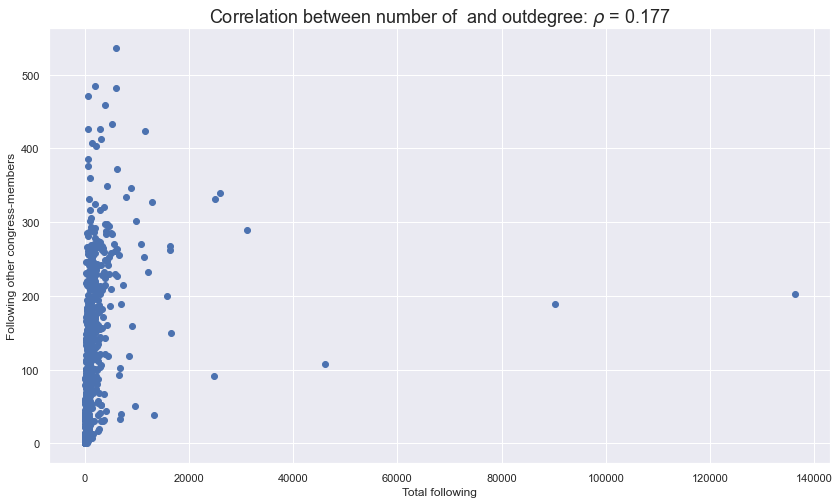

In [24]:
# Lists of length and out degree
Fol = [G.nodes[node]['Total_follow'] for node in G.nodes]
Od = [v for k,v in G.out_degree]

# Correlation coefficient
rho = np.corrcoef(Fol, Od)[1,0]

# Plot
plt.figure(figsize = (14,8))
plt.scatter(Fol,Od)
plt.title(fr'Correlation between number of  and outdegree: $\rho$ = {rho:.3f}', fontsize = 18)
plt.ylabel('Following other congress-members')
plt.xlabel('Total following')
plt.show()

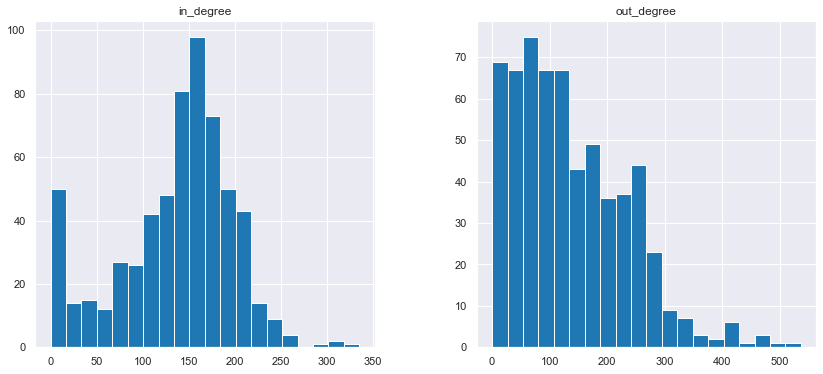

In [25]:
# Store in and out degree in datafram
degree_distribution = pd.DataFrame({
    'in_degree' : np.array(list(dict(G.in_degree).values())),
    'out_degree' : np.array(list(dict(G.out_degree).values()))
})

# Illustrate results
hist = degree_distribution[['in_degree', 'out_degree']].hist(bins=20, figsize=(14,6), color = "tab:blue")

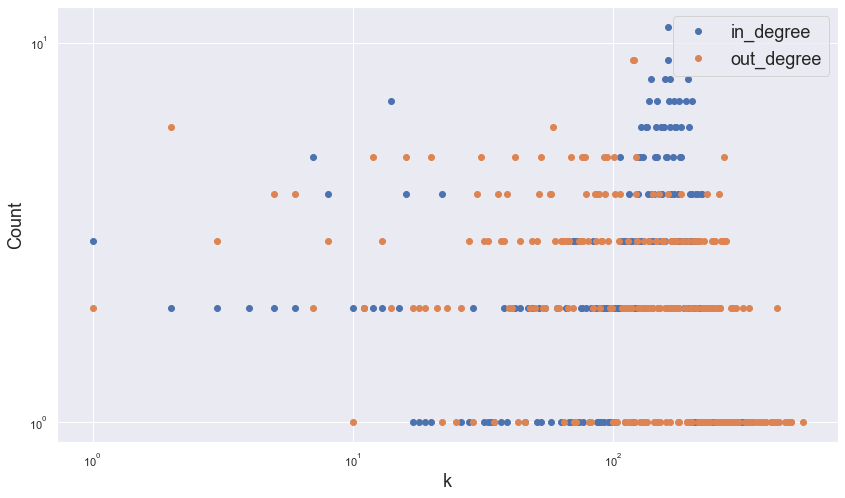

In [26]:
# Initialize plot
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize = (14,8))
degree_distribution['in_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
degree_distribution['out_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel("k", fontsize = 18)
ax1.set_ylabel("Count", fontsize = 18)
ax1.legend(fontsize = 18)
plt.show()

## Show Graph

In [27]:
G_U = G.to_undirected()

In [28]:
# Node size
node_size = [Degree for Key, Degree in G_U.degree]

In [29]:
# Node colors
color_dict = {"D": "#0015BC", "R": "#DE0100", 'I': "tab:gray", 'L': "#FED105"}
node_color = [color_dict[v] for k,v in nx.get_node_attributes(G_U,'Party').items()]

In [30]:
# Edge colors
def color_edge(Party1, Party2):
    # Orange between two republican
    if Party1 == 'R' and Party2 == 'R':
        color = 'tab:orange'
    
    # Cyan between two democrates
    elif Party1 == 'D' and Party2 == 'D':
        color = 'tab:cyan'
    
    # Gray when connected to an independent
    elif Party1 == 'I' or Party2 == 'I':
        color = "tab:gray"

    # Yellow when connected to a liberal
    elif Party1 == 'L' or Party2 == 'L':
        color = "#FED105"
    
    # Purple elsewhere (between democrat and republican)
    else:
        color = 'tab:purple'
        
    return color 

# Get add edges colors
edge_colors = [
    color_edge(*(nx.get_node_attributes(G_U, 'Party')[f],
                 nx.get_node_attributes(G_U, 'Party')[t]))
    for f, t in G_U.edges
]

In [31]:
# Define eagle
_, attributes = svg2paths('../figures/eagle.svg')
dstirng = ""
for k, v in enumerate(attributes):
    dstirng += v['d']  # print d-string of k-th path in SVG

eagle = parse_path(dstirng)
eagle.vertices -= eagle.vertices.mean(axis=0)
eagle = eagle.transformed(mpl.transforms.Affine2D().rotate_deg(180))

shape_dict = {"Representative": "^", "Senator": "h", 'POTUS': eagle}
node_shape = [shape_dict[v] for k,v in nx.get_node_attributes(G_U,'Type').items()]

100%|██████████| 1000/1000 [00:06<00:00, 163.70it/s]
BarnesHut Approximation  took  0.85  seconds
Repulsion forces  took  3.46  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  1.52  seconds
AdjustSpeedAndApplyForces step  took  0.11  seconds


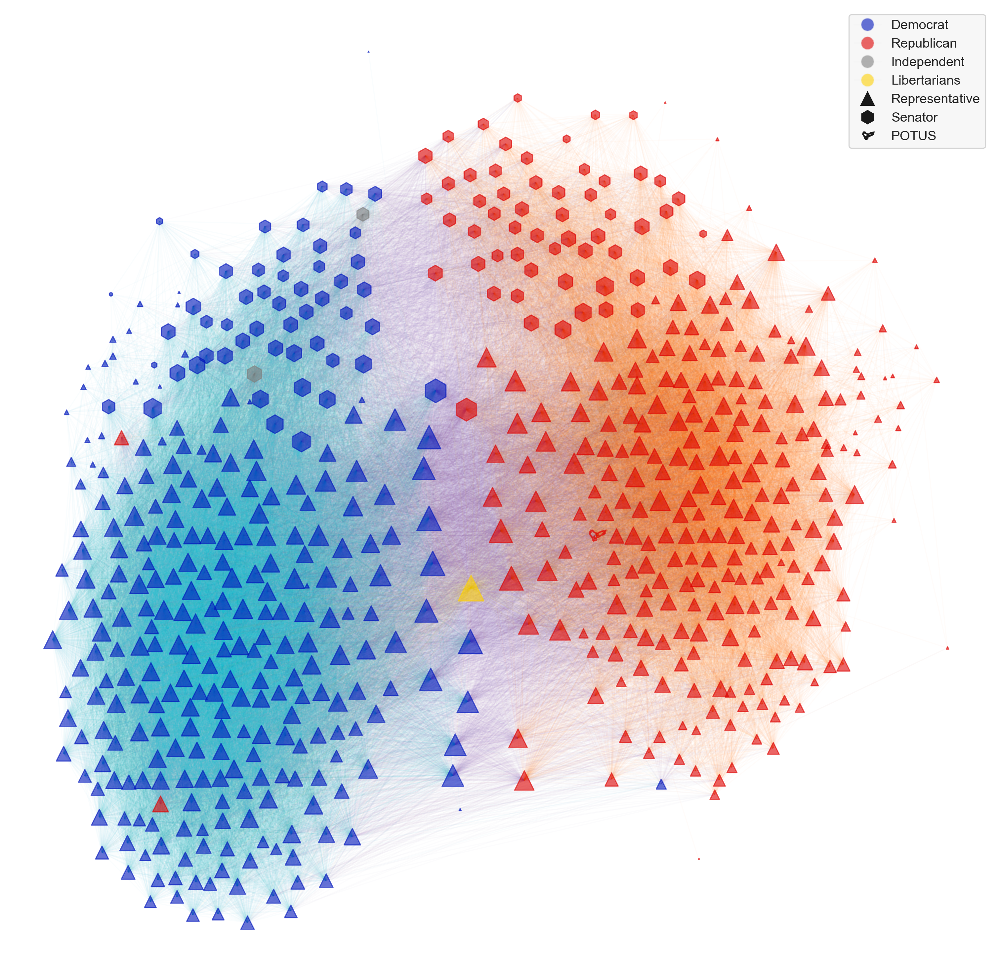

In [37]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=False,  # Dissuade hubs
    edgeWeightInfluence = 0.5, # Performance

    # Performance
    jitterTolerance=0.2,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=0.6,

    # Tuning
    scalingRatio=5.0,
    gravity=1.0,

    # Log
    verbose=True
)

# Initialize
plt.figure(figsize=(16,16), dpi = 240)

# Calculate positions
positions = forceatlas2.forceatlas2_networkx_layout(G_U, pos=None, iterations=1000)


# Draw graph
for i, node in enumerate(G.nodes):
    nx.draw_networkx_nodes(
        G = G_U,
        pos = positions,
        nodelist = [node],
        node_size = node_size[i],
        node_shape = node_shape[i],
        node_color = node_color[i],
        alpha=0.6
    )

nx.draw_networkx_edges(
    G = G_U,
    pos = positions,
    edge_color = edge_colors,
    alpha=0.02
)

# Legend
legend_elements = [Line2D([0], [0], marker='o', color='#F5F5F5', label=dict_abb_party[Party],
                          markerfacecolor=col, markersize=12, alpha=0.6) for Party, col in color_dict.items()]+\
                   [Line2D([0], [0], marker=Marker, color='k', label=Type,
                          markerfacecolor="k", linewidth=0, markersize=12, alpha=1) for Type, Marker in shape_dict.items()]
plt.legend(handles = legend_elements, facecolor = "#F5F5F5", loc=0, fontsize = 12)


# Show and save
plt.axis('off')
plt.savefig('../figures/Follow_graph.jpg', bbox_inches = 'tight', pad_inches = 0)
plt.show()